In [1]:
import matplotlib.pyplot as plt #for graph plotting
import networkx as nx #for creating, analysis and visualization of graphs
from collections import Counter #occurances of items count
import numpy as np #later to be used in plotting cumulative distribution (week 3)


# WEEK 1

In Week 1, we created a graph based on a dataset representing character interactions from the TV show Friends. The dataset was provided in a text file format, where each line containing two character names represented an interaction between those characters. Each character was considered a node in the network, and the interactions between them were represented as edges.

We first implemented a function to extract edges and nodes from the dataset and built a graph including edge weights that corresponded to the number of interactions between characters. We also developed a function to visualize the graph. Since the graph contained many nodes and edges, we decided to create and visualize a subgraph to better explore the network and extract meaningful insights.

Finally, we calculated key graph metrics such as the number of nodes, edges, average degree, and graph density using both simple and built-in NetworkX functions.

Here we are creating a function that reads our dataset txt file, processes each line to extract interactions between characters(edges) and characters names(nodes) to further use it to build the graph:

In [ ]:
def read_graph_from_file(file_path):# defining function
    edges = [] # empty list to store info on edges(interactions between characters)
    with open(file_path, 'r') as f:
        for line in f:# loop that goes through each line one at the time
            line = line.strip()# we used this to remove any extra whitespace at the beggining and the end of the line, so the code will only the actual data, ignoring blank spaces.
            if line and not line.startswith('#'):# there we just check if line is valid
                parts = line.split()  # we wrote this to split the line into a list of parts based on whitespace.
                if len(parts) == 2:  # checks if line contains exactly two parts, to make sure that it was an interaction, not a monologue or something
                    node1, node2 = sorted(parts) # we sort the data to ensure that the graph would be undirected
                    edges.append((node1, node2)) # adds a pair of characters to the list of interactions.This list is used to store all character interactions, which we will use for graph.
    return edges 


# Example usage of the function:
file_path = 'friends_episodes.txt' # assigning file path to file_path variable
edges = read_graph_from_file(file_path) #using the function we created above 

Creating a function that creates a graph based on the edges provided and assignes weights to edges based on interactions:

In [3]:
def create_graph(edges): # defining the function
    G = nx.Graph()# there, we create an empty undirected graph object G using network X library that we imported previously. 
    interaction_counts = Counter(tuple(sorted(edge)) for edge in edges)# there we store each unique pair of characters as a key and number of their interactions(weight) as a value.
    for (char1, char2), weight in interaction_counts.items():
        G.add_edge(char1, char2, weight=weight)# this adds the edge between a pair of characters and assigns a weight based on the amount of times they interacted.
    return G

#Basically, this function takes a list of character interactions, counts how many times they interacted and then creates a graph, where characters are nodes and edges are weighted by how many times they've interacted.

Creating a function that draws the graph:

In [77]:
def draw_graph(G):# defining a function
    pos = nx.spring_layout(G, seed=42)# we used spring layout here to calculate the positions of nodes in the graph to make it look prettier.connected ones are together, unconnected are pushed apart.
    weights = nx.get_edge_attributes(G, 'weight')# it retrieves the amount of times characters interacted and then stores it in the dictionary.
    
    plt.figure(figsize=(100, 100))# there we create a blank canva to draw the graph on it
    nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=10000, font_size=10, edge_color='grey')# draws the graph using thiese parameters of the nodes and edges
    nx.draw_networkx_edge_labels(G, pos, edge_labels=weights)# adds labels to the edges of how many times these characters interacted with each other
    plt.title('Friends Character Interaction Network' , fontsize=200)# just decided to add a title
    plt.show()# this line displays graph on screen 
    #this function generates the graph on canva using all of the previously obtaines information and added parameters

Creating a function for computing the the metrics: number of nodes, number of edges, avg.degree, and density:

In [34]:
def compute_metrics(G): # defining the function
    num_nodes = G.number_of_nodes()# returns a number of nodes in the graph G, each node is the character. 
    num_edges = G.number_of_edges()# returns a number of interactions in the graph G
    avg_degree = sum(dict(G.degree()).values()) / num_nodes# we calculate avg degree by computing total degree sum/num of nodes
    density = nx.density(G)# there we used an existed function for siplicity, but it uses the same formula as we did in class. 
    
    print(f"Number of nodes: {num_nodes}")
    print(f"Number of edges: {num_edges}")
    print(f"Average degree: {avg_degree:.2f}")#2 decimal places
    print(f"Density: {density:.4f}")#4 decimal places
    
    return num_nodes, num_edges, avg_degree, density

Example usage of the functions we creted above: creating a graph, drawing it, then computing the metrics:

In [83]:
# we're creating a graph G, using "create_graph" function based on the list of edges we already created above:
G = create_graph(edges) 

# drawing the graph G
draw_graph(G) 

#computing the metrics for graph G using the "compute_metrics" function
compute_metrics(G) 

Number of nodes: 747
Number of edges: 1610
Average degree: 4.31
Density: 0.0058


(747, 1610, 4.310575635876841, 0.0057782515226231105)

Comments for computed results:

Number of nodes:747 - indicates that there are 747 different characters feautured in the provided dataset of Friends TV show.
Number of edges:1610 - indicates that there are 1610 pairs of characters who interacted at least once during the show.
Average degree: 4.31 - indicate the average number of connections each of the characters had, which means that each character interacts with about 4 other characters.
Density - 0.0058 - shows that graph is very sparse. This density indicate that only about 0.58% of possible interactions between characters (nodes) actually occured. 

Additionaly, we also thought of drawing the subgraph of G for better visualization of the edges with largest edge weight

Creating a function that creates a subgraph of graph G based on specific edge weight criteria:

In [86]:
def create_subgraph(G, min_weight=None): # defining the function that takes the original Graph, minimum edge weight to be included in the subgraph
    if min_weight: #checks if minimum weight criteria is pprovided
        edges = [(u, v) for u, v, w in G.edges(data='weight') if w >= min_weight] # filters edges where the weight is greater than or equal to min_weight
        subgraph = G.edge_subgraph(edges).copy()# create a subgraph containing only these edges and their nodes
    else: 
        raise ValueError("You must specify 'min_weight'.") # if no min_weight is provided, raise an error
    
    return subgraph # return the resulting subgraph

Creating a function that draws the subgraph (same structure as the one we created before, but with different parameters for drawing itself like figure size and etc):

In [87]:
def draw_subgraph(subgraph):
    pos = nx.spring_layout(subgraph, seed=42) # computes positions for the nodes in the subgraph using a spring layout algorithm
    weights = nx.get_edge_attributes(subgraph, 'weight') # extract the 'weight' attribute for each edge in the subgraph

    plt.figure(figsize=(6, 6)) #a blank canva to draw the graph on it
    nx.draw(subgraph, pos, with_labels=True, node_color='lightblue', node_size=3000, font_size=10, edge_color='black') # draws the graph using thiese parameters of the nodes and edges
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=weights) # adds labels to the edges of how many times these characters interacted with each other
    plt.title('Subgraph of Character Interaction Network', fontsize=20) # add title to the created drawing
    plt.show()

Example usage of functions for creating and drawing the subgraph:

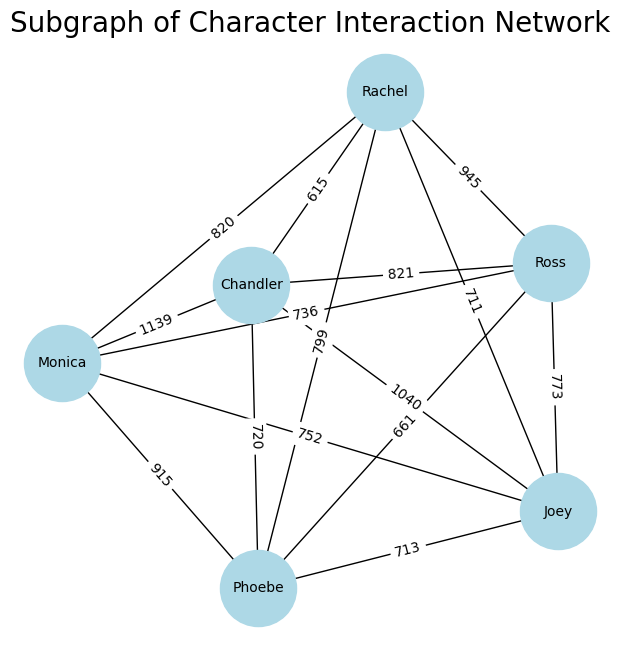

In [88]:
# create a subgraph with specific criteria. For example: subgraph that only includes only edges with weight >= 70
subgraph = create_subgraph(G, min_weight=70)

# draw the subgraph
draw_subgraph(subgraph)



In [21]:
G.nodes #shows all the nodes

NodeView(('Joey', 'Monica', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'waitress', 'LeonardGreen', 'Paul', 'Barry', 'Franny', 'Marsha', 'Carol', 'Judy', 'Jack', 'Susan', 'Robbie', 'DrOberman', 'Mindy', 'Paula', 'Alan', 'Lizzy', 'Allan', 'Joanne', 'Kiki', 'Leslie_1_4', 'nurseSizemore', 'pizzaGuy', 'brattyBoy', 'neighbor', 'visaCardGuy', 'Angela', 'Bob', 'Janice', 'Tony', 'horribleWoman', 'actress(Eva)', 'Aurora', 'director_1_6', 'JillGoodacre', 'MrHeckles', 'Paolo', 'Shelly', 'auntLillian', 'NanasNurse', 'Nana', 'Andrea', 'girl_1_8', 'Lowell', 'Brian', 'Terry', 'customer_1_9', 'obsessionGirl', 'Marcel', 'David', 'Max', 'Sandy_date', 'funBobby', 'kids', 'girl_1_10', 'comaGuy', 'JayLeno', 'NoraBing', 'Syl', 'receptionist_1_12', 'Roger', 'MrTribbiani', 'Ronni', 'GloriaTribbiani', 'Kristen', 'Lorraine', 'waiter', 'firemanDave', 'Charlie', 'Ed', 'firemanCharlie', 'firemanEd', 'MsTedlock', 'Celia', 'Wendy', 'MrCostilick', 'Helen', 'Steve', 'Fran', 'Ursula', 'Nina', 'MrDouglas', 'H.HuntAsCustomer

In [9]:
G.number_of_nodes() #outputs the total number of nodes

747

# WEEK 2

In week 2, we focused on calculating key network properties such as average clustering and transitivity. 

We decided to calculate Average Clustering and Transitivity number because these metrics provide a clearer understanding of the social structure and group dynamics, which are key to the show's theme, compared to the more general structural measures of diameter and average distance.

First, we calculated the graph's average clustering coefficient using the built-in NetworkX function nx.average_clustering(), taking into account edge weights to reflect the number of interactions between characters. This gives an idea of how tightly connected the nodes in the graph are.

Additionally, we calculated transitivity using both the built-in nx.transitivity() function and by manually counting triangles and connected triplets. The manual method involved iterating over each node, identifying its neighbors, counting potentially connected triplets (wedges), and inspecting the triangles by checking whether pairs of neighbors are connected. The final transitivity was calculated as the ratio of triangles to connected triplets. This allowed us to understand how tightly connected the network is compared to the number of potential connections.

Here we're calculating the average clustering using the built-in networkx function: 

In [10]:
avg_clustering= nx.average_clustering(G,weight="weight")
print(f'The average clustering for this graph is: {avg_clustering}') 

The average clustering for this graph is: 0.0043491121320485


We're calculating the transitivity using the built-in networkx function:

In [11]:
transitivit_y= nx.transitivity(G) 
print(f'The transitivity for this graph is: {transitivit_y}')

The transitivity for this graph is: 0.0335009492845488


In [13]:
def calculate_transitivity(G):
    total_triangles = 0 # initializes the count of triangles in the graph
    connected_triples = 0  # initializes the count of connected triples (wedges)


    #counting the triangles manually
    for node in G.nodes(): # iterates over each node in the graph
        neighbors = list(G.neighbors(node)) # gets the neighbors of the current node
        k = G.degree[node]  #gets the degree of the current node
        
        #counting the wedges/triples
        if k >= 2: # only consider nodes with at least two neighbors
            connected_triples += k * (k - 1) // 2 # formula to count the possible connected triples
        
        #counting the total triangles: for each pair of neighbors, check if they are connected
        for i in range(k): # iterates over the neighbors
            for j in range(i + 1, k): # compares each pair of neighbors
                if G.has_edge(neighbors[i], neighbors[j]): # checks if there's an edge between the pair
                    total_triangles += 1 #if connected, it's a triangle
    
    #since each triangle is counted three times (once at each node), so we divide it by 3
    total_triangles = total_triangles // 3

    #calculating transitivity: ratio of triangles to connected triples
    if connected_triples > 0: # checks if there are any connected triples
        transitivity = (3 * total_triangles) / connected_triples #calculates the transitivity
    else:
        transitivity = 0.0  #if there is no connected triples, transitivity=0

    return transitivity

Example usage of function above that calculates the transitivity:

In [14]:
transitivit_y2=calculate_transitivity(G)
print(f'Transitivity calculated using basic functions is: {transitivit_y2}')

Transitivity calculated using basic functions is: 0.0335009492845488


# WEEK 3

During week 3: we chose closeness centrality as our local notion to analyze the graph because it provides a measure of how quickly a node can reach other nodes in the "Friends" network.

This metric in our opinion is the most relevant way to understand the position and influence of each character during season 1 of the show. 

By using this centrality, we identify key characters and interconnectedness of the characters. 
Our main characters will have the highest closeness centrality, but we will see who among them has more social interactions than the rest.

After creating our graph, we analyse it with respect to closeness centrality. 

Creating the function to calculate closeness centrality:

In [17]:
def calculate_closeness_centrality(G):
    closeness = {} # initializes an empty dictionary to store the closeness centrality for each node
    
    for node in G.nodes():# iterates over each node in the graph
        
        # we compute the shortest path lengths to all other nodes
        lengths = nx.single_source_shortest_path_length(G, node)
        
        # filtering out unreachable nodes
        reachable = [length for length in lengths.values() if length > 0]
        
        if reachable: # closeness centrality = number of reachable nodes / sum of distances
            closeness[node] = len(reachable) / sum(reachable)  # we use the Closeness Centrality formula
        else:
            closeness[node] = 0.0  # regarding isolated nodes
    return closeness # returns the dictionary with closeness centrality for all nodes

Example usage of the function created above that calculates the closeness centrality:

In [18]:
# Calculating closeness centrality using our previous functions
closeness_centrality = calculate_closeness_centrality(G)

# Displaying closeness centrality for each node for clarity
print("Closeness Centrality Dictionary:", closeness_centrality)

# Finding the most central node
most_central_node = max(closeness_centrality, key=closeness_centrality.get)
print(f'The most central node based on Closeness Centrality is: {most_central_node}! With value {closeness_centrality[most_central_node]}.')

Closeness Centrality Dictionary: {'Joey': 0.6016129032258064, 'Monica': 0.5703363914373089, 'Chandler': 0.5850980392156863, 'Phoebe': 0.5703363914373089, 'Ross': 0.591593973037272, 'Rachel': 0.5846394984326019, 'waitress': 0.3924250394529195, 'LeonardGreen': 0.49078947368421055, 'Paul': 0.489501312335958, 'Barry': 0.39744272775705913, 'Franny': 0.36337067705796394, 'Marsha': 0.372069825436409, 'Carol': 0.4914361001317523, 'Judy': 0.49502322495023227, 'Jack': 0.49403973509933774, 'Susan': 0.45571166768478927, 'Robbie': 0.3694898464586429, 'DrOberman': 0.3972310969116081, 'Mindy': 0.40676117775354415, 'Paula': 0.36337067705796394, 'Alan': 0.489501312335958, 'Lizzy': 0.36337067705796394, 'Allan': 0.3877338877338877, 'Joanne': 0.3924250394529195, 'Kiki': 0.3693069306930693, 'Leslie_1_4': 0.36912419594260265, 'nurseSizemore': 0.43498542274052476, 'pizzaGuy': 0.4121546961325967, 'brattyBoy': 0.37188434695912265, 'neighbor': 0.3693069306930693, 'visaCardGuy': 0.4, 'Angela': 0.4012910166756320

In [84]:
def plot_cumulative_distribution(centrality_values):
    sorted_values = np.sort(list(centrality_values.values())) # sorts the centrality values in ascending order
    cumulative_counts = np.arange(1, len(sorted_values) + 1) / len(sorted_values) # calculates the cumulative distribution (proportion of nodes up to each centrality value)

    plt.figure(figsize=(12, 6)) # new figure for plotting with a size defined
    plt.plot(sorted_values, cumulative_counts, marker='o', linestyle='none') # plots the sorted centrality values against their cumulative proportion
    plt.title("Cumulative Distribution of Closeness Centrality") #adds a title 
    plt.xlabel("Closeness Centrality") # labels the x-axis as "Closeness Centrality"
    plt.ylabel("Cumulative Proportion") # labels the y-axis as "Cumulative Proportion"
    plt.grid() # adds a grid to the plot for better readability
    plt.xscale('log')  # Logarithmic scale is optimal to visualize the data better in terms of main characters vs side characters. 
    plt.yscale('log')  # Main characters will move up and right on the graph whereas the unrelevant characters will not. 
    plt.show()  # Displaying the plot

Plotting the distribution:

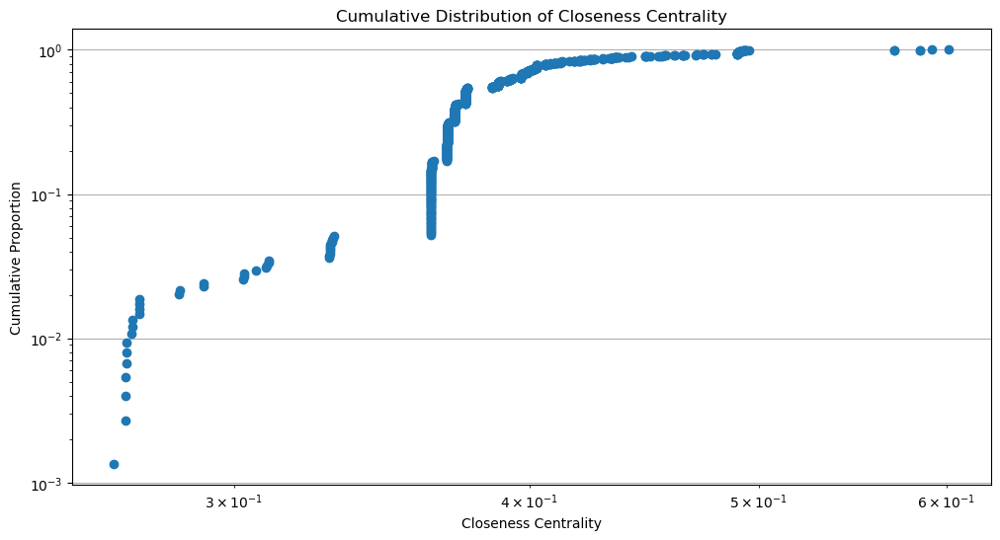

In [85]:
plot_cumulative_distribution(closeness_centrality)